- This notebook is entirely based on https://www.tensorflow.org/tutorials/images/classification
- https://www.tensorflow.org/tutorials/generative/style_transfer

In [1]:
import os
import numpy as np
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
random_seed = 3093453

#batch_size = 256
batch_size = 128
img_height = 299
img_width = 299

In [3]:
cwd = os.getcwd()
cwd, _ = os.path.split(cwd)
data_dir = os.path.join(cwd, "dataset")
data_dir

'/Users/fynn/Projects/PokeDex/dataset'

In [4]:
# Before gif: 4421 files
# after Gif 135387
# After Downsampling: 18345
# One per gif: 6633
# with tcg: 20808
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.1,
  subset="training",
  seed=random_seed,
  shuffle=True,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.1,
  subset="validation",
  seed=random_seed,
  shuffle=True,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 21686 files belonging to 1008 classes.
Using 19518 files for training.


2024-05-28 16:25:50.099846: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-05-28 16:25:50.099892: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-05-28 16:25:50.099900: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-05-28 16:25:50.099932: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-05-28 16:25:50.099948: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Found 21686 files belonging to 1008 classes.
Using 2168 files for validation.


In [5]:
class_names = np.array(train_ds.class_names)

num_classes = len(class_names)

2024-05-28 16:25:50.778842: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


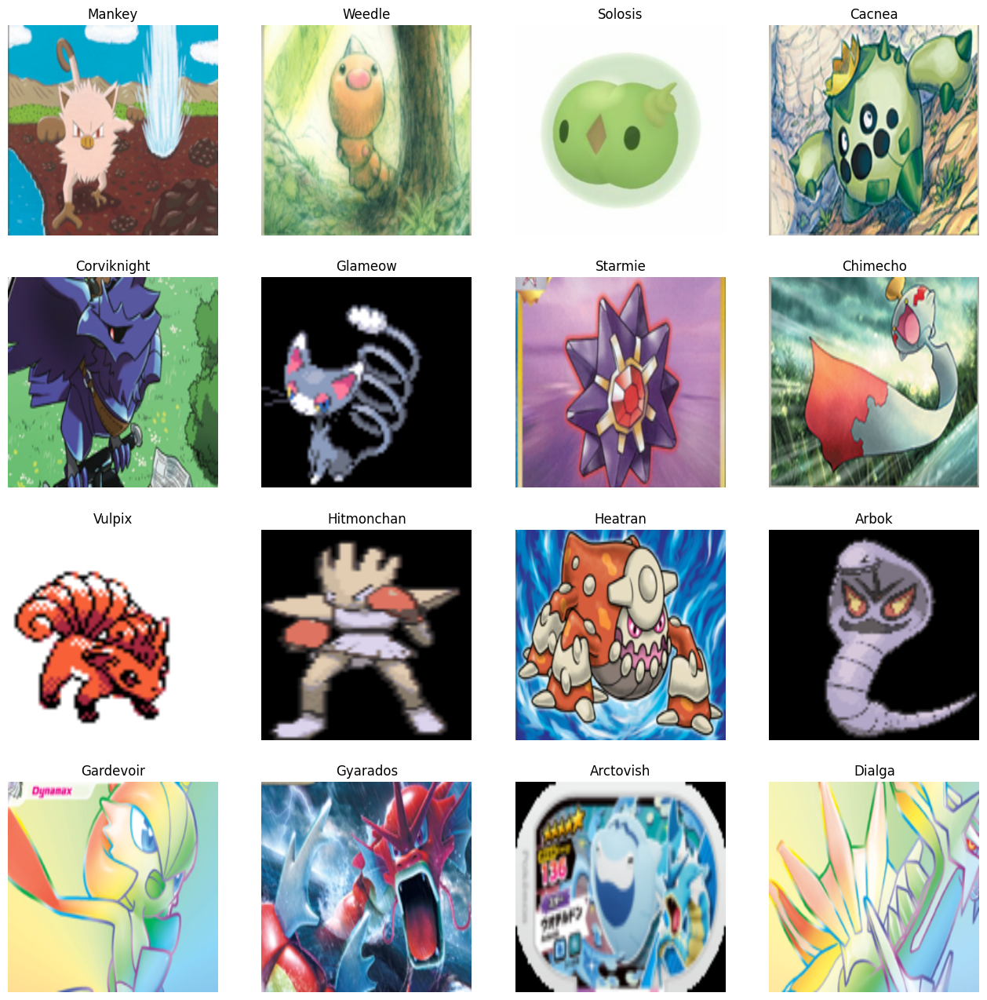

In [6]:
import matplotlib.pyplot as plt




plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [7]:
#import tensorflow_hub as hub
#hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')


In [8]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    
    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim
    new_shape = tf.cast(shape * scale, tf.int32)
    img = tf.image.resize(img, new_shape)
    #img = tf.keras.preprocessing.image.smart_resize(img, (512, 512))
    img = img[tf.newaxis, :]
    return img

In [9]:
import random

context_image_paths = [
#    keras.utils.get_file(
#        "starry_night.jpg", "https://i.imgur.com/9ooB60I.jpg"
#    ),
#    tf.keras.utils.get_file(
#        'kandinsky5.jpg',
#        'https://storage.googleapis.com/download.tensorflow.org/'
#        'example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg'
#    ),
]


def style_images_for_upsampling(images, context_image_paths:list[str], probability:float=0.5):
    """
    """
    def decision(probability=probability):
        return random.random() < probability
        

    if not decision():
        #print("No styling")
        return images

    # scale images
    images = images/255

    context_image_path = random.choice(context_image_paths)
    context_image = load_img(context_image_path)

    images = hub_model(images/255, context_image*0.5+0.5)[0]

    images = tf.keras.preprocessing.image.smart_resize(
        images,
        size=(299, 299),
        interpolation='bilinear',
    )
    images = images*255

    return images

    
#hubbed_images = style_images_for_upsampling(images, context_image_paths=context_image_paths)
#hubbed_images

2024-05-28 16:25:52.317175: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


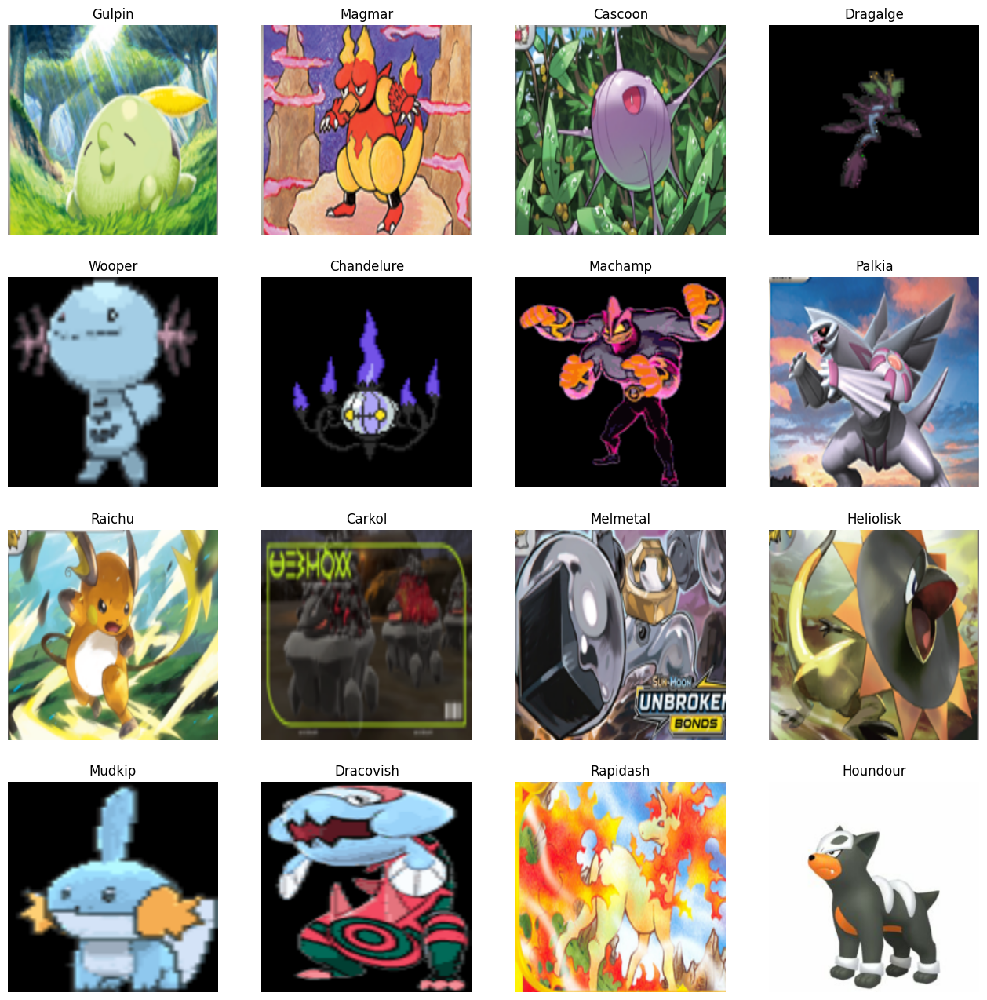

In [10]:
import matplotlib.pyplot as plt

class_names = np.array(train_ds.class_names)


plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

2024-05-28 16:25:53.707753: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


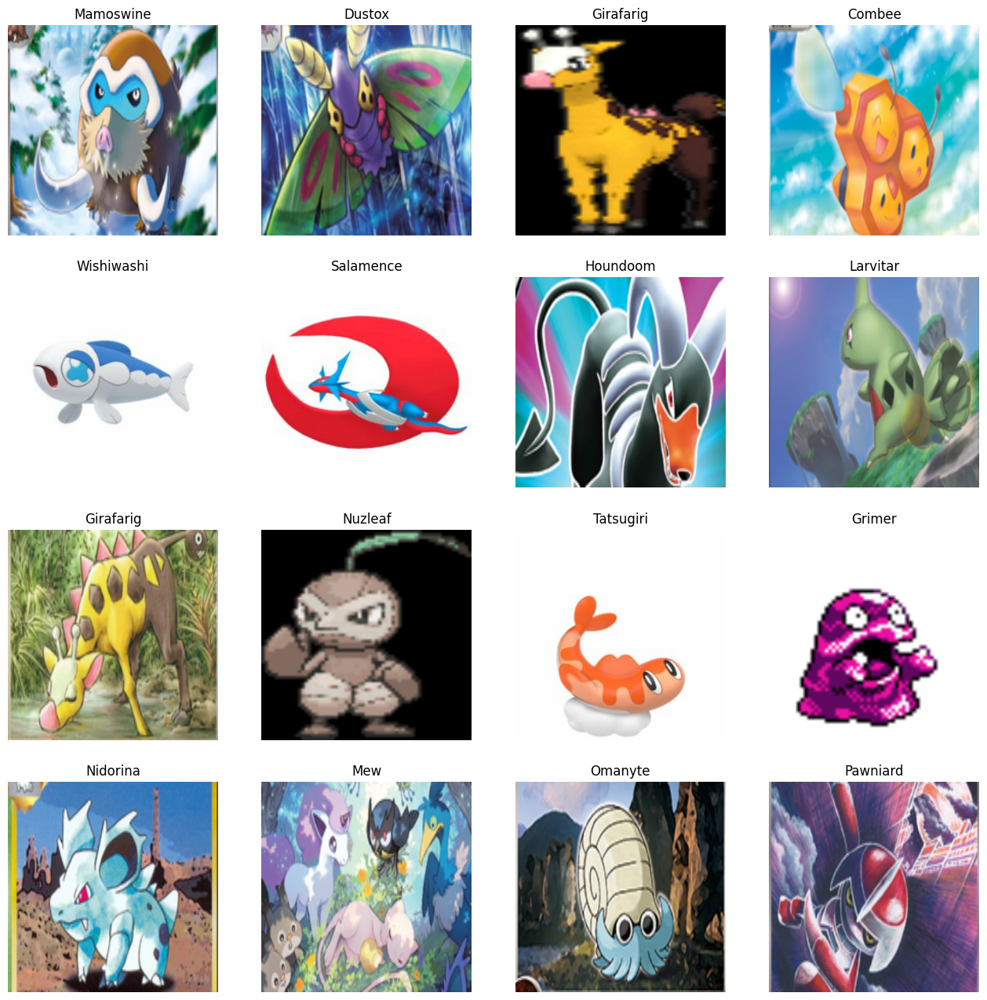

In [11]:
import matplotlib.pyplot as plt

class_names = np.array(train_ds.class_names)


plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  images = style_images_for_upsampling(images, context_image_paths=context_image_paths, probability=0)
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

2024-05-28 16:25:55.095438: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


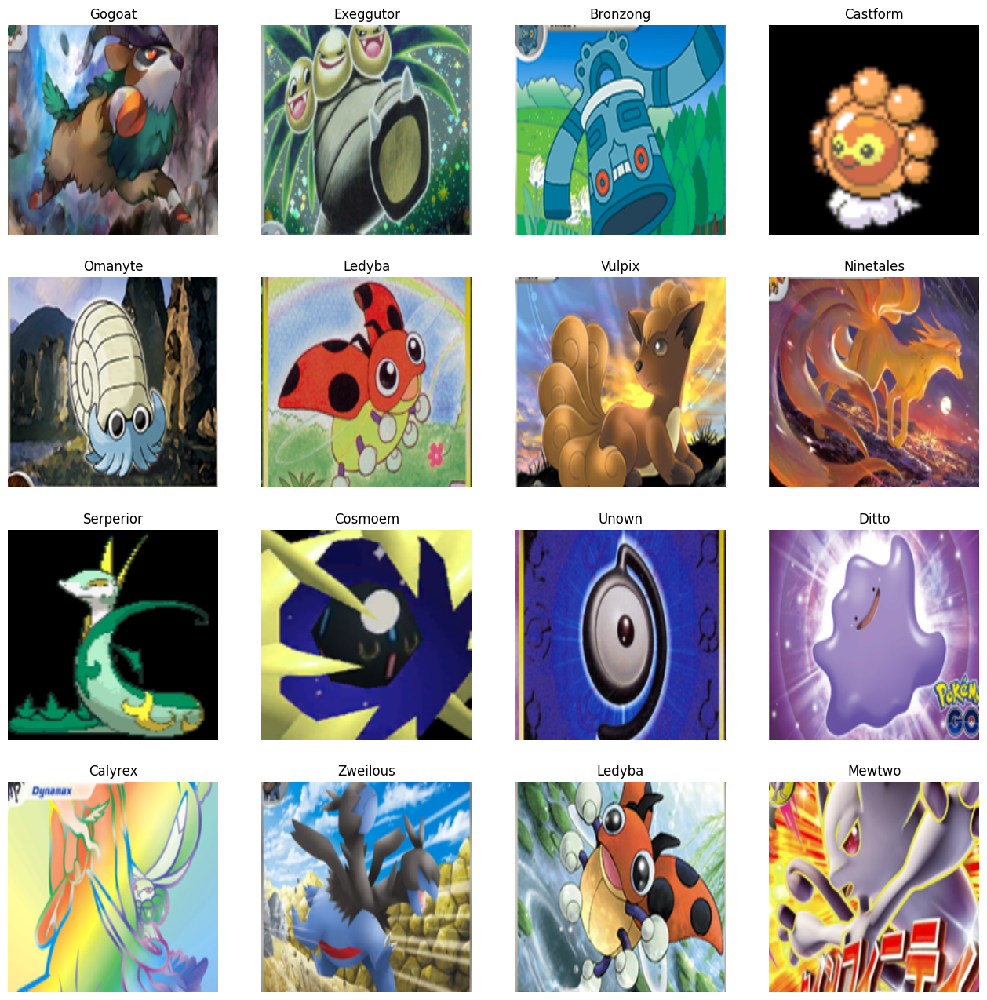

In [12]:
import matplotlib.pyplot as plt




plt.figure(figsize=(16, 16))
for images, labels in train_ds.map(lambda x, y: (tf.image.random_hue(
    image=x, max_delta=0.5,
), y) ).take(1):
  images = style_images_for_upsampling(images, context_image_paths=context_image_paths, probability=0)
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

## Data Augmentation

In [13]:
## TODO:

# CREATE RANDOM HUE LAYER:
# tf.image.random_hue(image, 0.1)
# or apply map: https://www.tensorflow.org/hub/tutorials/cropnet_on_device

In [14]:
data_augmentation = keras.Sequential(
  [ 
    layers.Input( (img_height,img_width,3) ),
    layers.RandomTranslation(0.05, 0.05, fill_mode="reflect"),
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    
    #layers.RandomContrast(0.8),
    #layers.GaussianNoise(0.05)
  ]
)

2024-05-28 16:25:56.840243: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2024-05-28 16:25:57.224759: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:25:57.575309: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:25:57.843059: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:25:58.096553: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:25:58.353574: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:25:58.592420: I metal_plugin/src/ke

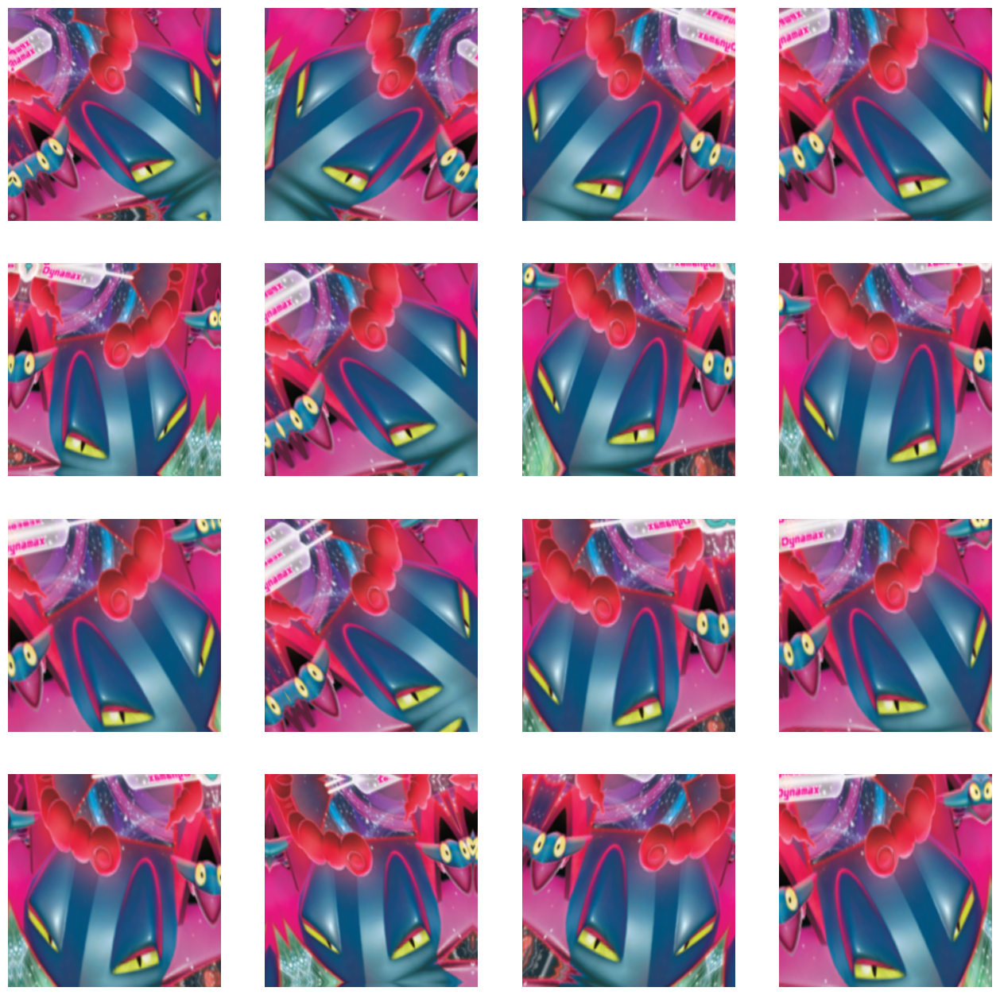

In [15]:
plt.figure(figsize=(16, 16))
for images, _ in train_ds.take(1):
  for i in range(16):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

2024-05-28 16:26:02.327534: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2024-05-28 16:26:02.670476: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:26:02.974135: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:26:03.230463: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:26:03.477775: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:26:03.724293: I metal_plugin/src/kernels/stateless_random_op.cc:282] Note the GPU implementation does not produce the same series as CPU implementation.
2024-05-28 16:26:03.963907: I metal_plugin/src/ke

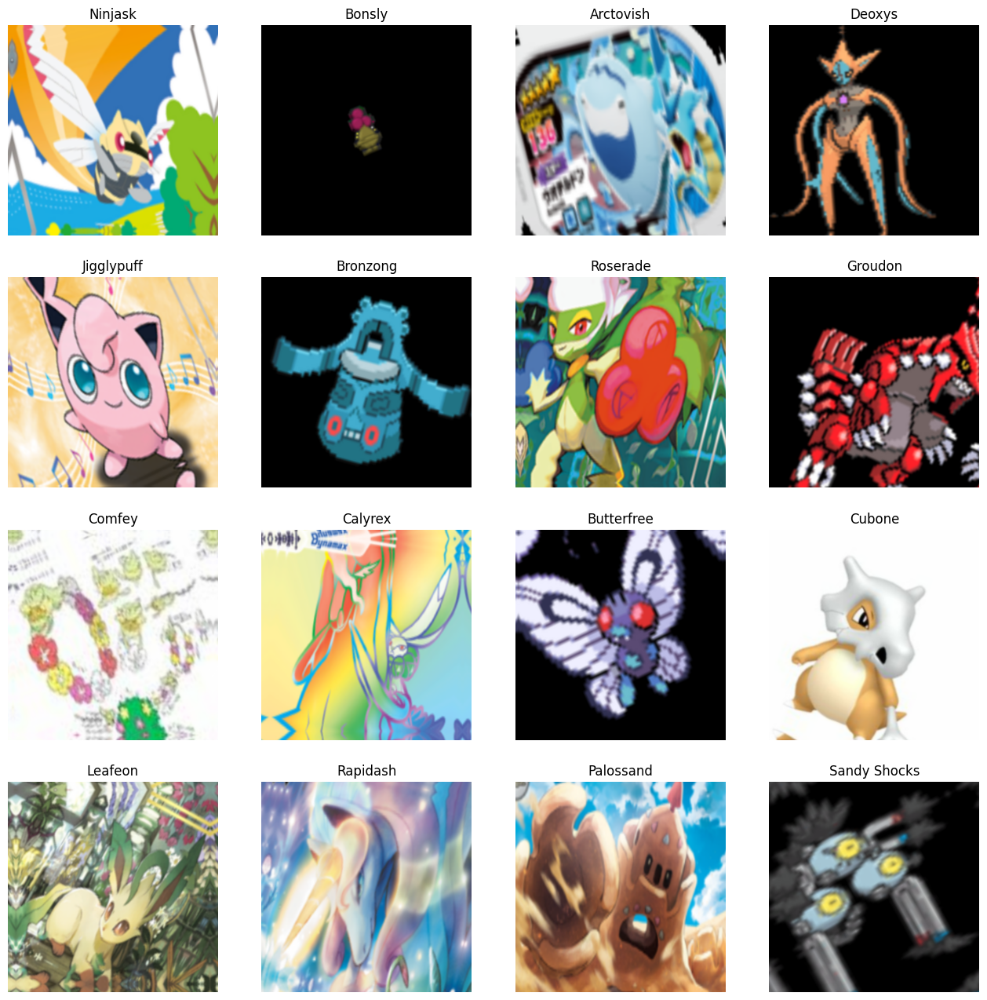

In [16]:
plt.figure(figsize=(16, 16))
for images, labels in train_ds.take(1):
  for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    augmented_images = data_augmentation(images)
    plt.imshow(augmented_images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [17]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = (
    train_ds
    .cache()
    .map(lambda x, y: (data_augmentation(x), y),
         num_parallel_calls=tf.data.AUTOTUNE)
    .map(lambda x, y: (tf.image.random_hue(x, max_delta=0.5), y),
         num_parallel_calls=tf.data.AUTOTUNE)
    #.map(lambda x, y: (style_images_for_upsampling(x,context_image_paths,0.2), y),
    #     num_parallel_calls=tf.data.AUTOTUNE)
    #.map(lambda x, y: (x, tf.one_hot(y, len(class_names))))
    .map(lambda x, y: (x, tf.one_hot(y, num_classes)))
    .prefetch(buffer_size=AUTOTUNE)
)
val_ds = (
    val_ds
    .cache()
    #.map(lambda x, y: (x, tf.one_hot(y, len(class_names))))
    .map(lambda x, y: (x, tf.one_hot(y, num_classes)))
    .prefetch(buffer_size=AUTOTUNE)
)

# Model

## metrics

In [18]:
metrics=[
    'accuracy',
     #tf.keras.metrics.SparseTopKCategoricalAccuracy(k=5, name="Top5Accuracy"),
     #tf.keras.metrics.SparseTopKCategoricalAccuracy(k=10, name="Top10Accuracy"),
     tf.keras.metrics.TopKCategoricalAccuracy(k=5, name="Top5Accuracy"),
     tf.keras.metrics.TopKCategoricalAccuracy(k=10, name="Top10Accuracy")
]

## losses

In [19]:
losses = [
    #tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    #tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    tf.keras.losses.CategoricalFocalCrossentropy(
        alpha=0.25, gamma=2.0,
        from_logits=True
    ),
    
]

## Callbacks

In [20]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint

from datetime import datetime

patience = 3
now = datetime.now().strftime("%Y%m%d-%H%M%S")

tensorboard_log_path = os.path.join(cwd, "logs", "fit", now)
model_save_path = os.path.join(cwd, "models", f"{now}-ImageNet.keras")
model_save_path = os.path.join(cwd, "models", f"{now}-ImageNet")

print("log_dir: ", tensorboard_log_path)
print("model_path: ", model_save_path)



early_stopping = EarlyStopping(
    monitor='val_loss', patience=patience
)

lr_scheduler = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=round(patience/3),
    verbose=1,
)

model_checkpoint = ModelCheckpoint(
    filepath=model_save_path,
    monitor="val_loss",
    verbose=1,
    #save_best_only=True,
    save_best_only=True,
    save_weights_only=False,
    mode="auto",
    save_freq="epoch",
    initial_value_threshold=None,
)

tensor_board = TensorBoard(
    log_dir=tensorboard_log_path,
    histogram_freq=1,
    write_graph=True,
    write_images=True,
    write_steps_per_second=False,
    update_freq='epoch',
    #profile_batch=0,
    #embeddings_freq=0,
    #embeddings_metadata=None
)


callbacks=[early_stopping, lr_scheduler, model_checkpoint, tensor_board]

log_dir:  /Users/fynn/Projects/PokeDex/logs/fit/20240528-162607
model_path:  /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet


In [21]:
#!rm -rf ../logs/fit

In [22]:
# Load the TensorBoard notebook extension
#%load_ext tensorboard

In [23]:
#%tensorboard --logdir logs/fit/

## Model Architecture + Compilation

In [24]:
#In your includes
from keras.applications import Xception

#Since you're using the model for a different task, you'd want to remove the top
imagenet = Xception(weights='imagenet', include_top=True)

#Freeze layers 0 to x

for layer in imagenet.layers[:-5]:
    layer.trainable = False

#To see all the layers in detail and to check trainable parameters
#imagenet.summary()

In [25]:
output_layer = layers.Dense(
    num_classes,
    activation="softmax",
    name="outputs"
)

output = output_layer(imagenet.layers[-2].output)

model = tf.keras.Model(
    inputs=imagenet.inputs,
    outputs=output
)

#tf.keras.utils.plot_model(model)

In [26]:
model.compile(
    optimizer='adam',
    loss=losses,
    metrics=metrics
)

## Model Training

In [ ]:
epochs = 100
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks = callbacks,
)

Epoch 1/100


2024-05-28 16:26:08.671561: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.
/Users/fynn/Uni/MA/.venv/lib/python3.11/site-packages/keras/src/backend.py:5665: UserWarning: "`categorical_focal_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(
2024-05-28 16:26:09.992440: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2024-05-28 16:26:11.162176: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


  2/153 [..............................] - ETA: 9:45 - loss: 1.7307 - accuracy: 0.0000e+00 - Top5Accuracy: 0.0000e+00 - Top10Accuracy: 0.0039     

2024-05-28 16:26:21.502524: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 10/153 [>.............................] - ETA: 6:16 - loss: 1.7317 - accuracy: 0.0031 - Top5Accuracy: 0.0188 - Top10Accuracy: 0.0258 

2024-05-28 16:26:40.095522: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 15/153 [=>............................] - ETA: 5:49 - loss: 1.7310 - accuracy: 0.0057 - Top5Accuracy: 0.0188 - Top10Accuracy: 0.0292

2024-05-28 16:26:51.859448: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 17/153 [==>...........................] - ETA: 5:42 - loss: 1.7312 - accuracy: 0.0055 - Top5Accuracy: 0.0202 - Top10Accuracy: 0.0317

2024-05-28 16:26:56.653755: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 46/153 [========>.....................] - ETA: 4:22 - loss: 1.7171 - accuracy: 0.0080 - Top5Accuracy: 0.0248 - Top10Accuracy: 0.0421

2024-05-28 16:28:06.597214: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 69/153 [============>.................] - ETA: 3:26 - loss: 1.7014 - accuracy: 0.0104 - Top5Accuracy: 0.0312 - Top10Accuracy: 0.0496

2024-05-28 16:29:03.820265: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 77/153 [==============>...............] - ETA: 3:06 - loss: 1.6962 - accuracy: 0.0119 - Top5Accuracy: 0.0335 - Top10Accuracy: 0.0519

2024-05-28 16:29:22.662862: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2024-05-28 16:29:22.673367: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 88/153 [================>.............] - ETA: 2:37 - loss: 1.6932 - accuracy: 0.0127 - Top5Accuracy: 0.0348 - Top10Accuracy: 0.0533

2024-05-28 16:29:47.151846: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 95/153 [=================>............] - ETA: 2:18 - loss: 1.6912 - accuracy: 0.0128 - Top5Accuracy: 0.0348 - Top10Accuracy: 0.0535

2024-05-28 16:30:00.671514: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


111/153 [====================>.........] - ETA: 1:37 - loss: 1.6845 - accuracy: 0.0134 - Top5Accuracy: 0.0374 - Top10Accuracy: 0.0573

2024-05-28 16:30:32.490948: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: cHRM: inconsistent chromaticities


115/153 [=====================>........] - ETA: 1:28 - loss: 1.6834 - accuracy: 0.0136 - Top5Accuracy: 0.0373 - Top10Accuracy: 0.0574

2024-05-28 16:30:41.608390: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


153/153 [==============================] - ETA: 0s - loss: 1.6719 - accuracy: 0.0149 - Top5Accuracy: 0.0394 - Top10Accuracy: 0.0602

2024-05-28 16:31:55.572219: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2024-05-28 16:31:56.269752: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile



Epoch 1: val_loss improved from inf to 1.67005, saving model to /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet
INFO:tensorflow:Assets written to: /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet/assets


INFO:tensorflow:Assets written to: /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet/assets


153/153 [==============================] - 387s 2s/step - loss: 1.6719 - accuracy: 0.0149 - Top5Accuracy: 0.0394 - Top10Accuracy: 0.0602 - val_loss: 1.6700 - val_accuracy: 0.0161 - val_Top5Accuracy: 0.0480 - val_Top10Accuracy: 0.0696 - lr: 0.0010
Epoch 2/100
153/153 [==============================] - ETA: 0s - loss: 1.5742 - accuracy: 0.0246 - Top5Accuracy: 0.0618 - Top10Accuracy: 0.0950
Epoch 2: val_loss improved from 1.67005 to 1.63595, saving model to /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet
INFO:tensorflow:Assets written to: /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet/assets


INFO:tensorflow:Assets written to: /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet/assets


153/153 [==============================] - 344s 2s/step - loss: 1.5742 - accuracy: 0.0246 - Top5Accuracy: 0.0618 - Top10Accuracy: 0.0950 - val_loss: 1.6360 - val_accuracy: 0.0208 - val_Top5Accuracy: 0.0512 - val_Top10Accuracy: 0.0826 - lr: 0.0010
Epoch 3/100
153/153 [==============================] - ETA: 0s - loss: 1.4940 - accuracy: 0.0335 - Top5Accuracy: 0.0895 - Top10Accuracy: 0.1359
Epoch 3: val_loss improved from 1.63595 to 1.62408, saving model to /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet
INFO:tensorflow:Assets written to: /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet/assets


INFO:tensorflow:Assets written to: /Users/fynn/Projects/PokeDex/models/20240528-162607-ImageNet/assets


153/153 [==============================] - 345s 2s/step - loss: 1.4940 - accuracy: 0.0335 - Top5Accuracy: 0.0895 - Top10Accuracy: 0.1359 - val_loss: 1.6241 - val_accuracy: 0.0240 - val_Top5Accuracy: 0.0590 - val_Top10Accuracy: 0.0881 - lr: 0.0010
Epoch 4/100
153/153 [==============================] - ETA: 0s - loss: 1.4130 - accuracy: 0.0521 - Top5Accuracy: 0.1260 - Top10Accuracy: 0.1839
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 4: val_loss did not improve from 1.62408
153/153 [==============================] - 341s 2s/step - loss: 1.4130 - accuracy: 0.0521 - Top5Accuracy: 0.1260 - Top10Accuracy: 0.1839 - val_loss: 1.6258 - val_accuracy: 0.0291 - val_Top5Accuracy: 0.0761 - val_Top10Accuracy: 0.1116 - lr: 0.0010
Epoch 5/100
 13/153 [=>............................] - ETA: 5:07 - loss: 1.3727 - accuracy: 0.0727 - Top5Accuracy: 0.1556 - Top10Accuracy: 0.2157

In [ ]:
import pandas as pd

df = pd.DataFrame(history.history)

fig, ax = plt.subplots(2, figsize=(16, 16))
df.loc[:,df.columns.str.contains("loss")].plot(ax=ax[0])
df.loc[:,~df.columns.str.contains("loss")].plot(ax=ax[1])

# Predict on new data:

In [ ]:
img_path = "/Users/fynn/Downloads/Unknown.png"# Pikachu



img = tf.keras.utils.load_img(
    img_path, target_size=(img_height, img_width)
)

img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

In [ ]:
class_names[np.argsort(score)][::-1][:10]

In [ ]:
plt.barh(class_names[np.argsort(score)][-20:], np.sort(score)[-20:]);

# Add Labels to _best_ Model:

In [ ]:
model = tf.keras.models.load_model(model_save_path)

In [ ]:
#from keras.layers import Layer
#import tensorflow as tf

class LabelLimitLayer(keras.layers.Layer):

    def __init__(self, labels:list[str], topn:int=5, **kwargs):
        self.labels = list(labels)
        self.topn = topn
        super(LabelLimitLayer, self).__init__(**kwargs)

    def call(self, x):
        batch_size = tf.shape(x)[0]

        tf_labels = tf.constant([self.labels], dtype="string")
        tf_labels = tf.tile(tf_labels,[batch_size,1])

        top_k = tf.nn.top_k(x, k=self.topn, sorted=True, name="top_k").indices

        top_conf = tf.gather(x, top_k, batch_dims=1)
        top_labels = tf.gather(tf_labels, top_k, batch_dims=1)
        return [top_conf, top_labels]
    
    def compute_output_shape(self, input_shape):
        batch_size = input_shape[0]
        top_shape = (batch_size, self.topn)
        return [top_shape, top_shape]
    
    def get_config(self):
        config={'labels':self.labels,
                'topn':self.topn}
        base_config = super(LabelLimitLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
label_layer = LabelLimitLayer(labels=class_names, topn=num_classes)

label_layer_out = label_layer(model.output)

label_model = tf.keras.Model(
    inputs=model.inputs,
    outputs=label_layer_out
)

label_model(img_array)

In [ ]:
label_model(tf.concat([img_array, img_array], axis=0))